In [1]:
#!/usr/bin/env python
# coding: utf-8

# # Creating an optimisation with meta parameters
# 
# This notebook will explain how to set up an optimisation that uses metaparameters (parameters that control other parameters)


import bluepyopt as bpop
import bluepyopt.ephys as ephys
import pickle
from sciunit.scores import ZScore
from sciunit import TestSuite
from sciunit.scores.collections import ScoreArray
import sciunit
import numpy as np
from neuronunit.optimisation.optimization_management import dtc_to_rheo, switch_logic,active_values
from neuronunit.tests.base import AMPL, DELAY, DURATION

import quantities as pq
PASSIVE_DURATION = 500.0*pq.ms
PASSIVE_DELAY = 200.0*pq.ms
import matplotlib.pyplot as plt
from bluepyopt.ephys.models import ReducedCellModel
import numpy
from neuronunit.optimisation.optimization_management import test_all_objective_test
from neuronunit.optimisation.optimization_management import check_binary_match, three_step_protocol,inject_and_plot_passive_model
from neuronunit.optimisation.model_parameters import MODEL_PARAMS
'''
#MODEL_PARAMS["IZHI"].pop('c',None)


'''
MODEL_PARAMS["IZHI"].pop('C',None)
MODEL_PARAMS["IZHI"].pop('k',None)
MODEL_PARAMS["IZHI"].pop('vt',None)
MODEL_PARAMS["IZHI"].pop('vr',None)
MODEL_PARAMS["IZHI"].pop('vPeak',None)

import numpy as np


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# First we need to import the module that contains all the functionality to create electrical cell models

# If you want to see a lot of information about the internals, 
# the verbose level can be set to 'debug' by commenting out
# the following lines

# Setting up the cell
# ---------------------
# This is very similar to the simplecell example in the directory above. For a more detailed explanation, look there.

# For this example we will create two separate parameters to store the specific capacitance. One for the soma and one for the soma. We will put a metaparameter on top of these two to keep the value between soma and axon the same.

# The metaparameter, the one that will be optimised, will make sure the two parameters above keep always the same value

# And parameters that represent the maximal conductance of the sodium and potassium channels. These two parameters will be not be optimised but are frozen.

# ### Creating the template
# 
# To create the cell template, we pass all these objects to the constructor of the template.
# We *only* put the metaparameter, not its subparameters.


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# Now we can print out a description of the cell

model = simple_cell
model.params = {k:np.mean(v) for k,v in model.params.items() }


# With this cell we can build a cell evaluator.

# ## Setting up a cell evaluator
# 
# To optimise the parameters of the cell we need to create cell evaluator object. 
# This object will need to know which protocols to inject, which parameters to optimise, etc.

# ### Creating the protocols
# 
# 

#twostep_protocol


# ### Running a protocol on a cell
# 
# Now we're at a stage where we can actually run a protocol on the cell. We first need to create a Simulator object.



# The run() method of a protocol accepts a cell model, a set of parameter values and a simulator

# Plotting the response traces is now easy:

# ### Defining eFeatures and objectives
# 
# For every response we need to define a set of eFeatures we will use for the fitness calculation later. We have to combine features together into objectives that will be used by the optimalisation algorithm. In this case we will create one objective per feature:

from sciunit.scores import ZScore
tests = pickle.load(open("processed_multicellular_constraints.p","rb"))
nu_tests = tests['Hippocampus CA1 pyramidal cell'].tests
nu_tests[0].score_type = ZScore

nu_tests, OM, target = test_all_objective_test(MODEL_PARAMS["IZHI"],model_type="IZHI",protocol={'allen':False,'elephant':True})




nu_tests = list(nu_tests.values())
nu_tests[0].score_type = ZScore
target = three_step_protocol(target)
target.rheobase
target.everything






def initialise_test(v,rheobase):
    v = switch_logic([v])
    v = v[0]
    k = v.name
    if not hasattr(v,'params'):
        v.params = {}
    if not 'injected_square_current' in v.params.keys():    
        v.params['injected_square_current'] = {}
    if v.passive == False and v.active == True:
        keyed = v.params['injected_square_current']
        v.params = active_values(keyed,rheobase)
        v.params['injected_square_current']['delay'] = DELAY
        v.params['injected_square_current']['duration'] = DURATION
    if v.passive == True and v.active == False:

        v.params['injected_square_current']['amplitude'] =  -10*pq.pA
        v.params['injected_square_current']['delay'] = PASSIVE_DELAY
        v.params['injected_square_current']['duration'] = PASSIVE_DURATION

    if v.name in str('RestingPotentialTest'):
        v.params['injected_square_current']['delay'] = PASSIVE_DELAY
        v.params['injected_square_current']['duration'] = PASSIVE_DURATION
        v.params['injected_square_current']['amplitude'] = 0.0*pq.pA    
        
    return v

class NUFeature(object):
    def __init__(self,test,model):
        self.test = test
        self.model = model
    def calculate_score(self,responses):
        model = responses['model'].dtc_to_model()
        model.attrs = responses['params']
        
        ##
        # Last 4 lines entered
        ##
        if responses['rheobase'] is None:
            return 100.0
        if type(responses['rheobase']) is type(dict()):
            if responses['rheobase']['value'] is None:
                return 100.0
        self.test = initialise_test(self.test,responses['rheobase'])
        #if "RestingPotential" in str(self.test.name):            
        #    print(self.test.observation,self.test.prediction)
        if "Rheobase" in str(self.test.name):
            prediction = {'value':responses['rheobase']}

            score_gene = self.test.compute_score(self.test.observation,prediction)
            try:

                lns = np.abs(score_gene.log_norm_score)
            except:
                # works 1/2 time that log_norm_score does not work
                # more informative than nominal bad score 100
                #lns = float(score_gene.raw)

                lns = np.abs(float(score_gene.raw))
            return lns

        else:
            try:
                score_gene = self.test.judge(model)
            except:
                return 100.0

        if not isinstance(type(score_gene),type(None)):
            if not isinstance(score_gene,sciunit.scores.InsufficientDataScore):
                if not isinstance(type(score_gene.log_norm_score),type(None)):
                    try:

                        lns = np.abs(score_gene.log_norm_score)
                    except:
                        # works 1/2 time that log_norm_score does not work
                        # more informative than nominal bad score 100
                        s
                else:
                    # works 1/2 time that log_norm_score does not work
                    # more informative than nominal bad score 100

                    lns = np.abs(score_gene.raw)
            else:
                prediction = self.test.generate_prediction(model)
                lns = 100
        if lns==np.inf:
            

            lns = float(score_gene.raw)
        return lns

    
objectives = []
#for protocol in sweep_protocols:
#    stim_start = protocol.stimuli[0].step_delay
#    stim_end = stim_start + protocol.stimuli[0].step_duration
    
for tt in nu_tests:
    feature_name = '%s.%s' % (tt.name, tt.name)
    ft = NUFeature(tt,model)
    objective = ephys.objectives.SingletonObjective(
        feature_name,
        ft)
    objectives.append(objective)

score_calc = ephys.objectivescalculators.ObjectivesCalculator(objectives) 
        
        
#objectives[0]        



# ### Creating the cell evaluator
# 
# We will need an object that can use these objective definitions to calculate the scores from a protocol response. This is called a ScoreCalculator.




lop={}
from bluepyopt.parameters import Parameter
for k,v in MODEL_PARAMS["IZHI"].items():
    p = Parameter(name=k,bounds=v,frozen=False)
    lop[k] = p

print(lop)
simple_cell.params = lop

nu_tests[0].judge(simple_cell)

nu_tests[0].score_type = ZScore


# Combining everything together we have a CellEvaluator. The CellEvaluator constructor has a field 'parameter_names' which contains the (ordered) list of names of the parameters that are used as input (and will be fitted later on).
sweep_protocols = []
for protocol_name, amplitude in [('step1', 0.05)]:

    protocol = ephys.protocols.SweepProtocol(protocol_name, [None], [None])
    sweep_protocols.append(protocol)
twostep_protocol = ephys.protocols.SequenceProtocol('twostep', protocols=sweep_protocols)

MODEL_PARAMS["IZHI"]
cell_evaluator = ephys.evaluators.CellEvaluator(
        cell_model=simple_cell,
        param_names=MODEL_PARAMS["IZHI"].keys(),
        fitness_protocols={twostep_protocol.name: twostep_protocol},
        fitness_calculator=score_calc,
        sim='euler')
simple_cell.params_by_names(MODEL_PARAMS["IZHI"].keys())
simple_cell.params;


# ### Evaluating the cell
# 
# The cell can now be evaluate for a certain set of parameter values.

# In[ ]:


#default_params = MODEL_PARAMS["IZHI"]
#print(cell_evaluator.evaluate_with_dicts())


# ## Setting up and running an optimisation
# 
# Now that we have a cell template and an evaluator for this cell, we can set up an optimisation.
import dask
def dask_map_function(eval_,invalid_ind):
    results = []
    for x in invalid_ind:
        y = dask.delayed(eval_)(x)
        results.append(y)
    fitnesses = dask.compute(*results)
    return fitnesses



MU =10
optimisation = bpop.optimisations.DEAPOptimisation(
        evaluator=cell_evaluator,
        offspring_size = MU,
        map_function = dask_map_function,
        selector_name='IBEA',
        mutpb=1,
        cxpb=1)


# And this optimisation can be run for a certain number of generations



final_pop, hall_of_fame, logs, hist = optimisation.run(max_ngen=150)




/home/user/anaconda3/lib/python3.7/site-packages/airspeed/__init__.py:505: FutureWarning: Possible nested set at position 8
  KEYVALSEP = re.compile(r'[ \t]*:[[ \t]*(.*)$', re.S)


Random simulated data tests made
{'value': array(122.90611267) * pA}
{'value': array(8547.71061079) * ms}
{'mean': array(-65.22618636) * mV, 'std': array(1.42108547e-14) * mV}
{'value': array(31201968.59893269) * kg*m**2/(s**3*A**2)}
{'value': array(2.73947799e-07) * s**4*A**2/(kg*m**2)}
{'mean': array(0.00033) * s, 'std': array(0.) * s, 'n': 1}
{'value': array(49.0042374) * mV, 'mean': array(49.0042374) * mV, 'std': array(0.) * mV, 'n': 1}
{'mean': array(-27.86589846) * mV, 'std': array(0.) * mV, 'n': 1}
{'a': <bluepyopt.parameters.Parameter object at 0x7f1242960350>, 'b': <bluepyopt.parameters.Parameter object at 0x7f12480d96d0>, 'c': <bluepyopt.parameters.Parameter object at 0x7f1242960ad0>, 'd': <bluepyopt.parameters.Parameter object at 0x7f12429607d0>}


INFO:__main__:gen	nevals	avg    	std    	min     	max    
1  	10    	3.82998	4.43301	0.223453	11.1982


0.22345321524521994 0.22345321524521994 inside


INFO:__main__:2  	10    	3.13346	4.10984	0.223453	11.1982


0.22345321524521994 0.22345321524521994 inside


INFO:__main__:3  	10    	3.70011	4.28445	0.155224	9.80471


0.15522412940124825 0.15522412940124825 inside


INFO:__main__:4  	10    	2.36709	3.59247	0.0818666	9.76334


0.0818666098940026 0.0818666098940026 inside


INFO:__main__:5  	10    	3.56415	4.38163	0.0818666	10.0858


0.0818666098940026 0.0818666098940026 inside


INFO:__main__:6  	10    	4.81993	4.86351	0.0817919	11.0774


0.08179193396751107 0.08179193396751107 inside


INFO:__main__:7  	10    	4.84304	4.70422	0.048203 	10.6203


0.048202987213819756 0.048202987213819756 inside


INFO:__main__:8  	10    	6.13777	4.47787	0.048203 	10.3786


0.048202987213819756 0.048202987213819756 inside


INFO:__main__:9  	10    	2.94012	4.40288	0.048203 	10.4774


0.048202987213819756 0.048202987213819756 inside


INFO:__main__:10 	10    	3.3323 	4.43219	0.0434584	9.99774


0.04345839269538728 0.04345839269538728 inside


INFO:__main__:11 	10    	3.35329	4.52265	0.0434584	10.443 


0.04345839269538728 0.04345839269538728 inside


INFO:__main__:12 	10    	4.15365	4.69394	0.00886442	10.0999


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:13 	10    	1.63591	3.35002	0.00886442	10.1076


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:14 	10    	1.69597	3.37025	0.00886442	10.1539


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:15 	10    	1.55576	3.57812	0.00886442	10.7638


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:16 	10    	1.49687	3.34048	0.00886442	9.74148


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:17 	10    	1.60941	3.31221	0.00886442	9.71521


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:18 	10    	1.27915	3.00106	0.00886442	11.0634


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:19 	10    	2.00472	3.94229	0.00886442	11.0903


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:20 	10    	1.99193	3.7633 	0.00886442	9.99397


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:21 	10    	2.48835	4.25137	0.00886442	10.9709


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:22 	10    	0.199353	0.344842	0.00886442	1.0612 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:23 	10    	1.49034 	3.50381 	0.00886442	10.2425


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:24 	10    	1.05807 	2.88449 	0.00886442	10.1937


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:25 	10    	0.637978	2.1175  	0.00886442	10.0729


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:26 	10    	2.48089 	4.23932 	0.00886442	10.6659


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:27 	10    	4.31325 	4.94985 	0.00886442	10.9624


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:28 	10    	1.60515 	3.47423 	0.00886442	10.4053


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:29 	10    	2.10561 	3.90219 	0.00886442	10.6997


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:30 	10    	1.6112  	3.49811 	0.00886442	10.6072


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:31 	10    	1.115   	2.95421 	0.00886442	10.404 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:32 	10    	2.03809 	3.88204 	0.00886442	10.4737


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:33 	10    	2.03512 	3.97057 	0.00886442	10.6034


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:34 	10    	1.46461 	3.38584 	0.00886442	9.91435


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:35 	10    	1.05765 	2.94166 	0.00886442	10.2554


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:36 	10    	1.96908 	3.76775 	0.00886442	9.85062


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:37 	10    	1.55954 	3.47287 	0.00886442	10.405 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:38 	10    	1.0563  	2.91554 	0.00886442	10.3124


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:39 	10    	2.88829 	4.52241 	0.00886442	10.582 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:40 	10    	1.51863 	3.48822 	0.00886442	10.3405


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:41 	10    	1.91217 	3.76958 	0.00886442	9.78589


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:42 	10    	1.88154 	3.77772 	0.00886442	9.84337


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:43 	10    	2.03513 	4.0015  	0.00886442	11.1299


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:44 	10    	0.968768	2.82032 	0.00886442	9.72868


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:45 	10    	2.5483  	4.14637 	0.00886442	10.4619


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:46 	10    	2.52374 	4.32284 	0.00886442	11.2158


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:47 	10    	1.48119 	3.46571 	0.00886442	10.0923


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:48 	10    	2.81785 	4.38173 	0.00886442	10.092 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:49 	10    	3.3591  	4.54645 	0.00886442	10.1605


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:50 	10    	0.659689	2.17821 	0.00886442	10.3136


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:51 	10    	2.36496 	4.15411 	0.00886442	10.0874


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:52 	10    	2.86582 	4.45057 	0.00886442	10.4897


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:53 	10    	1.9817  	3.82088 	0.00886442	10.3541


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:54 	10    	3.33638 	4.66026 	0.00886442	10.5113


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:55 	10    	1.01922 	2.78936 	0.00886442	9.71632


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:56 	10    	1.07612 	2.99709 	0.00886442	10.6453


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:57 	10    	1.22169 	2.94266 	0.00886442	10.7272


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:58 	10    	0.988867	2.87615 	0.00886442	10.184 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:59 	10    	0.573492	2.20905 	0.00886442	10.4073


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:60 	10    	2.07923 	4.08618 	0.00886442	11.1032


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:61 	10    	1.9821  	3.86506 	0.00886442	10.2913


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:62 	10    	1.50727 	3.40378 	0.00886442	10.2521


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:63 	10    	2.0142  	3.82203 	0.00886442	10.534 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:64 	10    	1.06304 	2.90291 	0.00886442	10.2913


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:65 	10    	1.9281  	3.89151 	0.00886442	10.3851


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:66 	10    	3.33585 	4.67792 	0.00886442	10.5386


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:67 	10    	3.41085 	4.47916 	0.00886442	10.7073


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:68 	10    	1.50951 	3.45534 	0.00886442	10.9259


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:69 	10    	1.98472 	3.8453  	0.00886442	10.3807


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:70 	10    	1.52773 	3.51079 	0.00886442	10.535 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:71 	10    	1.51433 	3.35351 	0.00886442	9.91173


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:72 	10    	1.11788 	2.75947 	0.00886442	9.67272


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:73 	10    	1.15428 	3.11908 	0.00886442	10.9661


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:74 	10    	0.978185	2.83789 	0.00886442	9.75815


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:75 	10    	2.93949 	4.49984 	0.00886442	10.9215


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:76 	10    	0.607372	2.0971  	0.00886442	9.88272


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:77 	10    	1.12421 	3.039   	0.00886442	11.1675


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:78 	10    	1.99308 	3.9148  	0.00886442	10.4921


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:79 	10    	2.90598 	4.37945 	0.00886442	10.3336


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:80 	10    	1.06913 	2.89605 	0.00886442	10.0667


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:81 	10    	1.06225 	2.93866 	0.00886442	10.2522


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:82 	10    	1.45705 	3.33938 	0.00886442	9.65325


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:83 	10    	1.92358 	3.762   	0.00886442	9.76505


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:84 	10    	2.07652 	3.938   	0.00886442	10.5391


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:85 	10    	1.97337 	3.82067 	0.00886442	10.3049


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:86 	10    	1.69379 	3.4241  	0.00886442	10.2328


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:87 	10    	2.54949 	4.16643 	0.00886442	10.5093


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:88 	10    	2.99298 	4.44984 	0.00886442	10.4269


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:89 	10    	1.99702 	3.87458 	0.00886442	10.328 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:90 	10    	0.568941	2.05649 	0.00886442	9.67488


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:91 	10    	1.06844 	2.85232 	0.00886442	9.93153


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:92 	10    	1.14233 	2.86717 	0.00886442	9.9715 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:93 	10    	2.35529 	4.13924 	0.00886442	10.4866


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:94 	10    	0.697124	2.29089 	0.00886442	10.847 


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:95 	10    	2.91703 	4.4406  	0.00886442	10.1432


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:96 	10    	1.04851 	2.8951  	0.00886442	10.2101


0.008864424006664444 0.008864424006664444 inside


INFO:__main__:97 	10    	1.50051 	3.54926 	0.00319558	10.9448


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:98 	10    	1.97003 	3.84874 	0.00319558	10.2575


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:99 	10    	0.623392	2.09621 	0.00319558	9.89957


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:100	10    	1.52592 	3.36621 	0.00319558	9.9637 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:101	10    	1.94098 	3.8458  	0.00319558	10.1642


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:102	10    	0.653233	2.1043  	0.00319558	9.91586


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:103	10    	2.42295 	4.14356 	0.00319558	10.2555


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:104	10    	0.474929	2.01312 	0.00319558	9.47519


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:105	10    	1.08883 	2.87225 	0.00319558	10.3654


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:106	10    	3.24213 	4.52255 	0.00319558	10.0804


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:107	10    	1.95455 	3.92186 	0.00319558	10.5868


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:108	10    	1.56709 	3.41922 	0.00319558	10.4328


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:109	10    	3.44495 	4.65798 	0.00319558	10.8228


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:110	10    	1.90193 	3.87368 	0.00319558	10.0581


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:111	10    	1.07808 	2.9082  	0.00319558	10.4561


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:112	10    	3.36721 	4.64805 	0.00319558	10.9571


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:113	10    	1.05723 	2.84825 	0.00319558	9.78816


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:114	10    	2.05347 	3.97183 	0.00319558	10.8895


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:115	10    	0.639169	2.07068 	0.00319558	9.74596


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:116	10    	1.97956 	3.71813 	0.00319558	9.67775


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:117	10    	2.54429 	4.09237 	0.00319558	10.1434


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:118	10    	1.51192 	3.47759 	0.00319558	10.4113


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:119	10    	2.03517 	3.88771 	0.00319558	10.5444


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:120	10    	1.51487 	3.48859 	0.00319558	10.0604


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:121	10    	1.52033 	3.32967 	0.00319558	9.72044


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:122	10    	1.89136 	3.88559 	0.00319558	10.3871


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:123	10    	1.59196 	3.52424 	0.00319558	10.3569


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:124	10    	2.94072 	4.37972 	0.00319558	10.0016


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:125	10    	2.10742 	3.88162 	0.00319558	10.5643


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:126	10    	1.51755 	3.45546 	0.00319558	10.7838


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:127	10    	1.48807 	3.44089 	0.00319558	10.3278


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:128	10    	2.01249 	3.99157 	0.00319558	10.8253


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:129	10    	1.57976 	3.46956 	0.00319558	10.5963


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:130	10    	2.47371 	4.33905 	0.00319558	10.9405


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:131	10    	1.00922 	2.85366 	0.00319558	9.87881


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:132	10    	1.44861 	3.34436 	0.00319558	9.75904


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:133	10    	2.47534 	4.24859 	0.00319558	10.4543


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:134	10    	1.51511 	3.3187  	0.00319558	9.77385


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:135	10    	1.47532 	3.31711 	0.00319558	9.7384 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:136	10    	1.48367 	3.31449 	0.00319558	9.65195


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:137	10    	1.00953 	2.82471 	0.00319558	9.79983


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:138	10    	1.53765 	3.45638 	0.00319558	10.3019


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:139	10    	1.9855  	3.82456 	0.00319558	10.4946


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:140	10    	1.44968 	3.40593 	0.00319558	10.0973


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:141	10    	1.09693 	2.90548 	0.00319558	10.5602


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:142	10    	1.45037 	3.34616 	0.00319558	9.74432


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:143	10    	0.658346	2.15173 	0.00319558	10.1396


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:144	10    	2.46309 	4.19878 	0.00319558	10.9392


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:145	10    	3.79752 	4.7281  	0.00319558	10.5344


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:146	10    	1.6244  	3.50883 	0.00319558	11.0666


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:147	10    	1.08654 	2.81779 	0.00319558	9.85003


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:148	10    	1.54887 	3.43696 	0.00319558	10.1213


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:149	10    	1.93943 	3.9389  	0.00319558	10.3468


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:150	10    	1.90763 	3.80142 	0.00319558	10.0776


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:151	10    	2.39202 	4.03079 	0.00319558	9.61223


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:152	10    	1.21416 	2.98524 	0.00319558	10.9983


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:153	10    	0.19277 	0.377371	0.00319558	1.19565


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:154	10    	2.36096 	4.21909 	0.00319558	10.2992


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:155	10    	2.54361 	4.38052 	0.00319558	11.354 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:156	10    	2.42525 	4.13501 	0.00319558	9.9119 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:157	10    	2.85425 	4.35428 	0.00319558	10.0072


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:158	10    	2.84021 	4.42001 	0.00319558	10.6755


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:159	10    	0.584242	2.01737 	0.00319558	9.49843


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:160	10    	2.40359 	4.14131 	0.00319558	10.1106


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:161	10    	0.685899	2.18842 	0.00319558	10.3448


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:162	10    	1.14444 	3.15148 	0.00319558	11.0189


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:163	10    	2.42846 	4.29852 	0.00319558	10.7799


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:164	10    	1.95894 	3.86251 	0.00319558	10.2572


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:165	10    	2.08469 	4.0635  	0.00319558	10.7351


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:166	10    	2.51323 	4.24867 	0.00319558	11.2069


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:167	10    	1.97824 	3.87049 	0.00319558	10.9707


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:168	10    	0.685624	2.16781 	0.00319558	10.2434


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:169	10    	1.95775 	3.83724 	0.00319558	10.2685


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:170	10    	2.57859 	4.22186 	0.00319558	10.7406


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:171	10    	1.51162 	3.28945 	0.00319558	9.64575


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:172	10    	1.01782 	2.89569 	0.00319558	10.3258


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:173	10    	1.99281 	3.90918 	0.00319558	10.4569


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:174	10    	2.36892 	4.10499 	0.00319558	9.9897 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:175	10    	1.95435 	3.81024 	0.00319558	9.9106 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:176	10    	1.57388 	3.5345  	0.00319558	10.6462


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:177	10    	1.91173 	3.72772 	0.00319558	9.818  


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:178	10    	1.50778 	3.33587 	0.00319558	9.74266


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:179	10    	2.01384 	3.85295 	0.00319558	10.1689


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:180	10    	1.52934 	3.54761 	0.00319558	10.4767


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:181	10    	2.154   	3.89073 	0.00319558	10.3701


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:182	10    	3.78222 	4.80614 	0.00319558	10.1692


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:183	10    	0.984754	2.83517 	0.00319558	9.69907


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:184	10    	3.36237 	4.62997 	0.00319558	10.3382


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:185	10    	1.97143 	3.89039 	0.00319558	10.53  


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:186	10    	1.51417 	3.4999  	0.00319558	10.8351


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:187	10    	1.5051  	3.52782 	0.00319558	10.5611


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:188	10    	1.07975 	2.84016 	0.00319558	10.0065


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:189	10    	1.50057 	3.52238 	0.00319558	10.9982


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:190	10    	2.84344 	4.37072 	0.00319558	10.1937


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:191	10    	1.30423 	2.96014 	0.00319558	11.002 


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:192	10    	1.98455 	3.99845 	0.00319558	10.7919


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:193	10    	1.57353 	3.52337 	0.00319558	10.35  


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:194	10    	1.92109 	3.78378 	0.00319558	9.96725


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:195	10    	1.95031 	3.8469  	0.00319558	10.2263


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:196	10    	1.99071 	3.9375  	0.00319558	10.7202


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:197	10    	1.02983 	2.79918 	0.00319558	9.64531


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:198	10    	2.34215 	4.09257 	0.00319558	9.74817


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:199	10    	2.02532 	4.04553 	0.00319558	10.8651


0.00319557780374721 0.00319557780374721 inside


INFO:__main__:200	10    	0.971753	2.92234 	0.00262961	10.2526


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:201	10    	2.01685 	3.86474 	0.00262961	10.6541


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:202	10    	1.55958 	3.57886 	0.00262961	11.0411


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:203	10    	2.43034 	4.1887  	0.00262961	10.7193


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:204	10    	2.36719 	4.1027  	0.00262961	9.99121


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:205	10    	1.13311 	2.98527 	0.00262961	10.3874


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:206	10    	2.49871 	4.19214 	0.00262961	10.405 


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:207	10    	1.54187 	3.52969 	0.00262961	11.0724


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:208	10    	1.61231 	3.50098 	0.00262961	10.7211


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:209	10    	0.559901	2.02233 	0.00262961	9.53968


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:210	10    	2.85642 	4.48047 	0.00262961	10.3647


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:211	10    	2.90542 	4.5438  	0.00262961	10.805 


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:212	10    	1.95398 	3.80061 	0.00262961	9.97683


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:213	10    	1.99787 	3.91737 	0.00262961	10.6056


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:214	10    	1.48607 	3.38929 	0.00262961	10.0076


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:215	10    	2.04775 	4.01425 	0.00262961	11.0712


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:216	10    	0.546431	2.18136 	0.00262961	10.2963


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:217	10    	2.38637 	4.13613 	0.00262961	9.98631


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:218	10    	1.94563 	3.83675 	0.00262961	10.4668


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:219	10    	1.13071 	2.86395 	0.00262961	10.2243


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:220	10    	1.59789 	3.64207 	0.00262961	11.1024


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:221	10    	1.55991 	3.47196 	0.00262961	10.6989


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:222	10    	2.81699 	4.42027 	0.00262961	10.3302


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:223	10    	2.85931 	4.34735 	0.00262961	9.96989


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:224	10    	2.534   	4.14431 	0.00262961	10.6878


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:225	10    	1.98378 	3.75585 	0.00262961	9.83376


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:226	10    	2.5425  	4.21228 	0.00262961	10.8182


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:227	10    	1.55021 	3.48547 	0.00262961	10.3803


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:228	10    	2.39936 	4.28343 	0.00262961	10.6045


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:229	10    	1.03829 	2.91678 	0.00262961	10.1231


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:230	10    	0.711897	2.05115 	0.00262961	9.67047


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:231	10    	2.06305 	3.86871 	0.00262961	10.8914


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:232	10    	1.90175 	3.84708 	0.00262961	10.292 


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:233	10    	1.53503 	3.35079 	0.00262961	9.87076


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:234	10    	0.6333  	2.08283 	0.00262961	9.84516


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:235	10    	2.45568 	4.17914 	0.00262961	10.4545


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:236	10    	2.84133 	4.45316 	0.00262961	10.3972


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:237	10    	1.9595  	3.96025 	0.00262961	11.4323


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:238	10    	1.9596  	3.89375 	0.00262961	10.9708


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:239	10    	2.98398 	4.57732 	0.00262961	10.9643


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:240	10    	0.988911	2.94509 	0.00262961	10.5744


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:241	10    	1.04182 	2.77697 	0.00262961	9.57684


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:242	10    	2.4445  	4.09736 	0.00262961	10.3562


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:243	10    	3.30727 	4.66484 	0.00262961	10.7818


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:244	10    	2.32838 	4.11289 	0.00262961	10.2056


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:245	10    	2.13326 	3.90475 	0.00262961	10.9197


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:246	10    	1.02853 	2.9013  	0.00262961	10.0788


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:247	10    	1.61753 	3.52275 	0.00262961	10.8805


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:248	10    	1.96271 	3.72813 	0.00262961	9.70331


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:249	10    	3.37477 	4.64703 	0.00262961	10.4801


0.0026296091536967565 0.0026296091536967565 inside


INFO:__main__:250	10    	1.92477 	3.77492 	0.00262961	9.85835
INFO:__main__:Run stopped because of stopping criteria: Max ngen


Final population:  [[0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.024664890576034045, 7.179220645409064, -47.69203416367964, 86.3177489784089], [0.02466

[-65.22618636] mV [-65.22618636] mV


(0.002366648238327081, 0.24579853676974195)

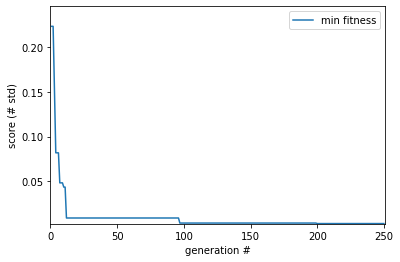

In [2]:


# The optimisation has return us 4 objects: final population, hall of fame, statistical logs and history. 
# 
# The final population contains a list of tuples, with each tuple representing the two parameters of the model


print('Final population: ', final_pop)


# The best individual found during the optimisation is the first individual of the hall of fame

best_ind = hall_of_fame[0]
print('Best individual: ', best_ind)
print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
cell_evaluator.param_dict(best_ind)
model.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}



opt = model.model_to_dtc()
opt.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}

check_binary_match(target,opt)
inject_and_plot_passive_model(opt,second=target)


# As you can see the evaluation returns the same values as the fitness values provided by the optimisation output. 
# We can have a look at the responses now.

# In[ ]:


#plot_responses(twostep_protocol.run(cell_model=simple_cell, param_values=best_ind_dict, sim=nrn))
 


# Let's have a look at the optimisation statistics.
# We can plot the minimal score (sum of all objective scores) found in every optimisation. 
# The optimisation algorithm uses negative fitness scores, so we actually have to look at the maximum values log.

gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
plt.plot(gen_numbers, min_fitness, label='min fitness')
plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 


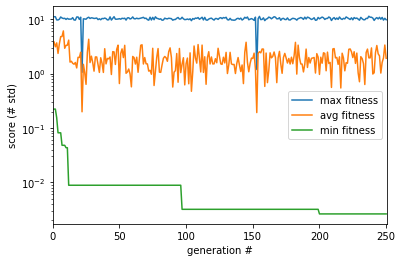

In [3]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
plt.plot(gen_numbers, max_fitness, label='max fitness')
plt.plot(gen_numbers, avg_fitness, label='avg fitness')
plt.plot(gen_numbers, min_fitness, label='min fitness')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.yscale('log')

plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()


<Figure size 432x288 with 0 Axes>

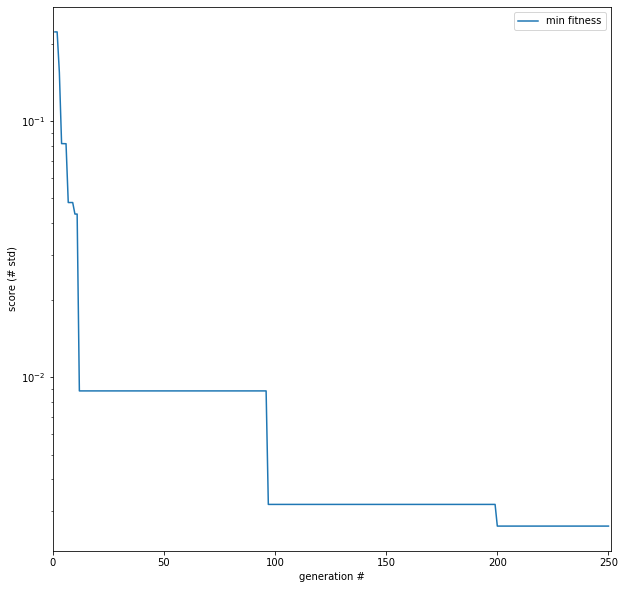

In [4]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
fig = plt.figure(figsize=(10,10))
#ax = fig.add_subplot(1,1)

plt.plot(gen_numbers, min_fitness, label='min fitness')
#ax.semilogy()
#ax.set_yscale('log')
plt.yscale('log')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()

[-65.22618636] mV [-65.22618636] mV


(AnalogSignal with 1 channels of length 80000; units mV; datatype float64 
 sampling rate: 100.0 1/ms
 time: 0.0 s to 0.8 s,
 <module 'matplotlib.pyplot' from '/home/user/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>)

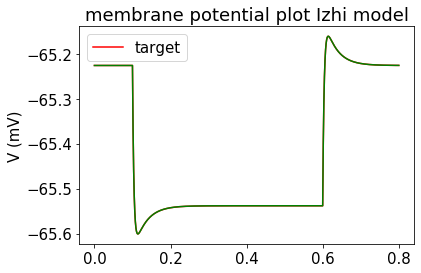

In [5]:
inject_and_plot_passive_model(opt,second=target,plotly=False)


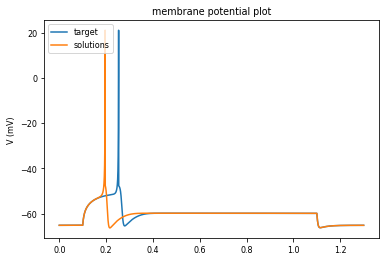

<Figure size 432x288 with 0 Axes>

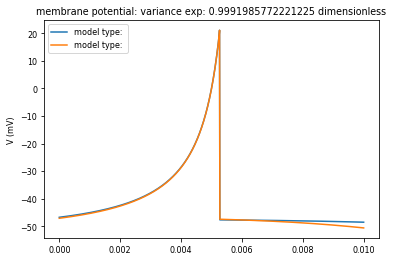

In [6]:
check_binary_match(opt,target,plotly=False,snippets=False)
check_binary_match(opt,target,plotly=False,snippets=True)


In [7]:
best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

In [8]:
objectives

{'RheobaseTest.RheobaseTest': 0.00014464829059625327,
 'TimeConstantTest.TimeConstantTest': 0.0008698359938322481,
 'RestingPotentialTest.RestingPotentialTest': 0.0,
 'InputResistanceTest.InputResistanceTest': 8.782039946104955e-05,
 'CapacitanceTest.CapacitanceTest': 0.0007602911525790519,
 'InjectedCurrentAPWidthTest.InjectedCurrentAPWidthTest': 0.0,
 'InjectedCurrentAPAmplitudeTest.InjectedCurrentAPAmplitudeTest': 0.0002780283718145037,
 'InjectedCurrentAPThresholdTest.InjectedCurrentAPThresholdTest': 0.0004889849454136503}

In [9]:
opt = dtc_to_rheo(opt)
print(opt.rheobase)


122.8823289682623 pA


In [10]:
target.rheobase

array(122.90611267) * pA

In [11]:
params = {}
params['injected_square_current'] = {}
#if v.name in str('RestingPotentialTest'):
params['injected_square_current']['delay'] = PASSIVE_DELAY
params['injected_square_current']['duration'] = PASSIVE_DURATION
params['injected_square_current']['amplitude'] = 0.0*pq.pA    

In [12]:

opt_model = opt.dtc_to_model()
opt_model.inject_square_current(params)
opt_vm = opt_model.get_membrane_potential()
opt_vm[-1]

array([-65.22618636]) * mV

In [13]:
target_model = target.dtc_to_model()
target_model.inject_square_current(params)
target_vm = target_model.get_membrane_potential()
target_vm[-1]

array([-65.22618636]) * mV

In [14]:
best_ind = hall_of_fame[1]
print('Best individual: ', best_ind)
print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
dtc= model.model_to_dtc()
opt = dtc_to_rheo(opt)
print(opt.rheobase)


Best individual:  [0.024664890576034045, 7.179220645409064, -47.69203416367964, 92.83545695771247]
Fitness values:  (0.00014464829059625327, 0.0008698359938322481, 0.0, 8.782039946104955e-05, 0.0007602911525790519, 0.0, 0.00039275801044119364, 0.0006907967918202069)
{'RheobaseTest.RheobaseTest': 0.00014464829059625327, 'TimeConstantTest.TimeConstantTest': 0.0008698359938322481, 'RestingPotentialTest.RestingPotentialTest': 0.0, 'InputResistanceTest.InputResistanceTest': 8.782039946104955e-05, 'CapacitanceTest.CapacitanceTest': 0.0007602911525790519, 'InjectedCurrentAPWidthTest.InjectedCurrentAPWidthTest': 0.0, 'InjectedCurrentAPAmplitudeTest.InjectedCurrentAPAmplitudeTest': 0.00039275801044119364, 'InjectedCurrentAPThresholdTest.InjectedCurrentAPThresholdTest': 0.0006907967918202069}
122.8823289682623 pA


In [15]:
#model.rheobase

In [16]:
len(hist.genealogy_history)/20


261.95

In [17]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
'''
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)

'''
MU =20
genes=[]
min_per_generations = []
for i,v in hist.genealogy_history.items():
    if i%25==0:
        min_per_gen = sorted([(gene,np.min(gene)) for gene in genes],key=lambda x: x[1])
        min_per_generations.append(min_per_gen[0][0])
        genes =[]
    genes.append(v.fitness.values)
df2 = pd.DataFrame()
scores = []
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    if j<len(min_per_generations):
        df2[index] = pd.Series(min_per_generations).values[j]#, index=df1.index)
        #scores.append(df2[str(i)])
df2    

#rescored = [np.sum(i) for i in range(0,len(scores)) ]
#rescored

,RheobaseTest,TimeConstantTest,RestingPotentialTest,InputResistanceTest,CapacitanceTest,InjectedCurrentAPWidthTest,InjectedCurrentAPAmplitudeTest,InjectedCurrentAPThresholdTest
0,0.000145,0.000145,0.000145,0.000145,0.000145,0.000145,0.000145,0.000145
1,0.330879,0.179834,0.048017,0.048017,0.031140,0.031140,0.141995,0.018814
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.045370,0.002789,0.002764,0.002764,0.000379,0.000379,0.020477,0.000387
4,0.307775,0.182188,0.044820,0.044820,0.030691,0.030691,0.121766,0.018346
5,9.015000,0.032533,0.018299,0.018299,0.004038,0.004038,9.061000,0.021380
6,0.392851,0.046787,0.014874,0.014874,0.005602,0.005602,0.426979,0.010778
7,0.618787,0.083698,0.026304,0.026304,0.009872,0.009872,0.606231,0.019031


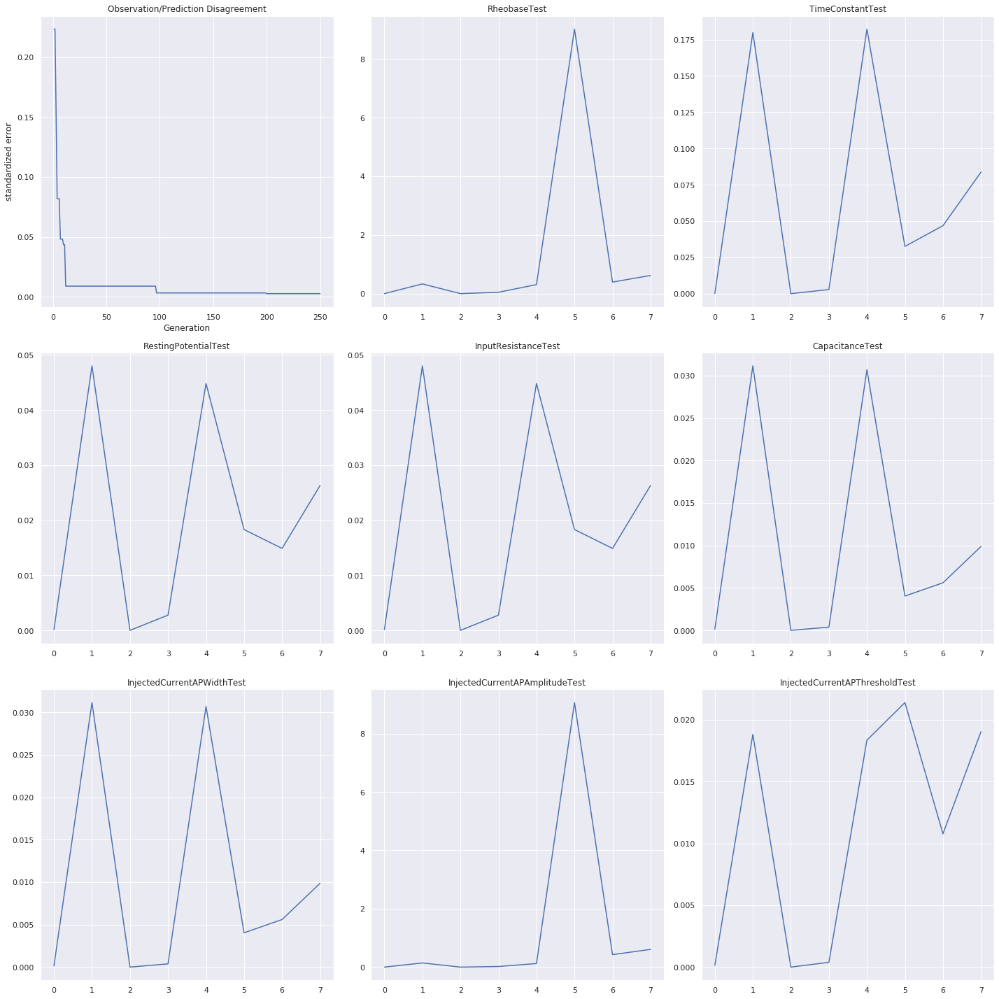

In [18]:
import math
import seaborn as sns
sns.set(style="darkgrid")

fig,axes = plt.subplots(3,3,figsize=(20,20))#math.ceil(len(objectives)/2+1),figsize=(20,20))
axes[0,0].plot(gen_numbers, min_fitness, label='min fitness')

axes[0,0].set_title('Observation/Prediction Disagreement')
for i,c in enumerate(df2.columns):
    ax = axes.flat[i+1]
    history = df2[c]
    #mn = mean[k.name] 
    #st = std[k.name] 
    #history = [(j[i]-mn)/st for j in scores ]
    #ax.axhline(y=mn , xmin=0.02, xmax=0.99,color='red',label='best candidate sampled')

    #ax.axvline(x=min_x , ymin=0.02, ymax=0.99,color='blue',label='best candidate sampled')
    ax.plot(history)
    ax.set_title(str(c))
    #bigger = np.max([np.max(history),mn])
    #smaller = np.max([np.min(history),mn])

    #ax.set_ylim([np.min(history),np.max(history)])
    #ax.set_ylabel(str(front[0].dtc.tests[i].observation['std'].units))
axes[0,0].set_xlabel("Generation")
axes[0,0].set_ylabel("standardized error")

plt.tight_layout()
#if figname is not None:
#    plt.savefig(figname)
#else:
plt.show()

INFO:numexpr.utils:NumExpr defaulting to 4 threads.


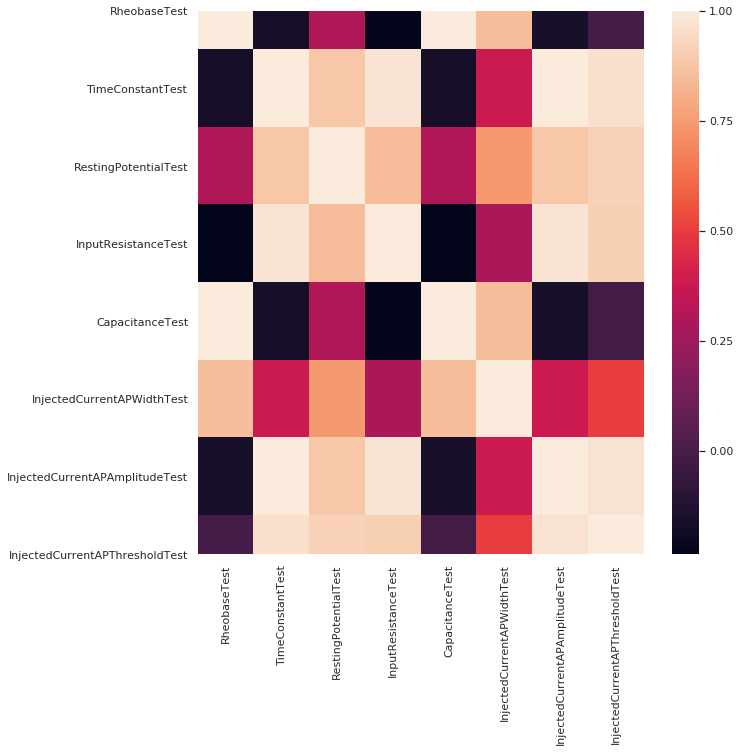

RheobaseTest                     -1.598894
TimeConstantTest                 -3.873655
RestingPotentialTest             -4.871568
InputResistanceTest              -3.520070
CapacitanceTest                  -1.584664
InjectedCurrentAPWidthTest       -3.995274
InjectedCurrentAPAmplitudeTest   -3.888633
InjectedCurrentAPThresholdTest   -4.225056
dtype: float64


In [19]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)

df1=(df1-df1.mean())/df1.std()

corr = df1.corr()
fig =plt.figure(figsize=(10,10))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)#, annot=True)
plt.show()


In [21]:
print(np.sum(np.sum(corr)))

35.55781305539297
